# Clustering and dimeonsionality reduction techniques combined


In this notebook, we show how the clustering performance changes when dimensionality reduction techniques like Principal component analysis (PCA), Independent component analysis (ICA), or Random projections (RP) is combined with algorithms like k-means.

[Read about ___k-means clustering algorithm___ here.](https://en.wikipedia.org/wiki/K-means_clustering)

[Read about ___principal component analysis___ here](https://en.wikipedia.org/wiki/Principal_component_analysis)

[Read about ___independent component analysis___ here](https://en.wikipedia.org/wiki/Independent_component_analysis)

---

In [2]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Create synthetic data using Scikit learn `make_blob` method

- Number of features: 8
- Number of clusters: 5
- Number of samples: 1000

In [3]:
from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs

In [4]:
# set parameters for making blobs
n_features = 8
n_cluster = 5
cluster_std = 1.5
n_samples = 1000

In [5]:
# make blobs
data1 = make_blobs(n_samples=n_samples,n_features=n_features,centers=n_cluster,cluster_std=cluster_std)

In [7]:
# get generated data
d1 = data1[0]

In [8]:
# save generated data to dataframe and print head
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,7.130591,3.274214,-2.083181,-3.312229,4.091279,-7.383547,-2.293888,6.506945
1,-3.955980,7.972098,1.557040,9.091835,-3.495812,8.089189,-1.466786,-0.347602
2,-7.293679,8.040932,1.681779,-9.947644,10.344690,-8.353041,0.031797,-0.726134
3,-2.472199,8.336726,0.811814,-10.372719,7.262564,-8.116934,-0.927330,3.795143
4,9.149484,1.067558,-1.481015,-3.272666,3.504570,-2.633851,-1.309456,7.532606


In [9]:
from itertools import combinations

In [11]:
# get all possible combinations for 2 out of 8 features
lst_vars=list(combinations(df1.columns,2))

In [12]:
# number of different combinations (2 out of 8)
len(lst_vars)

28

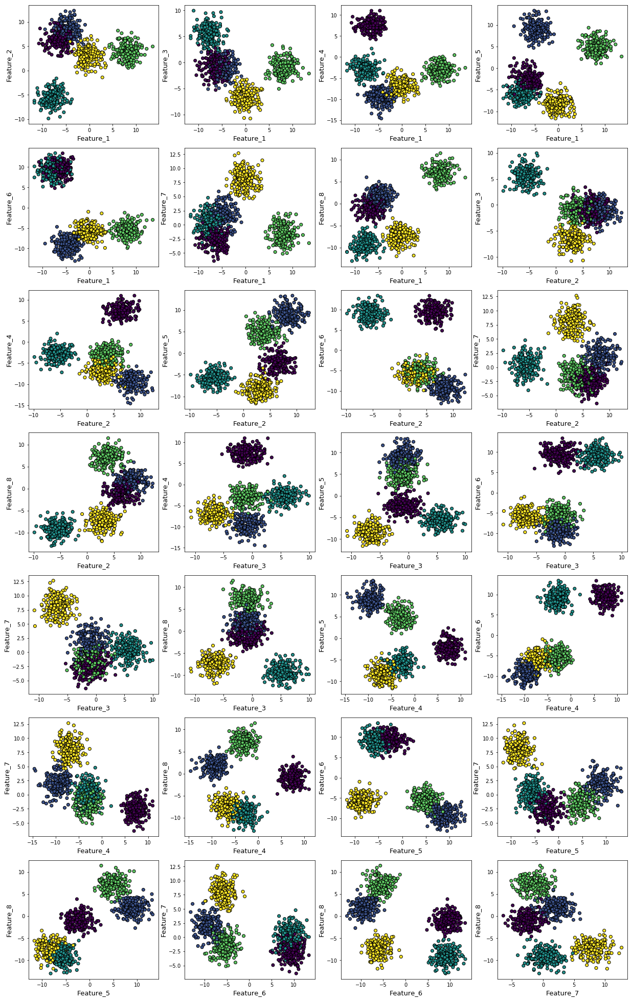

In [13]:
# generate 2D plots that visualize clusters using only 2 features at a time (for all 2D feature combinations)

plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [14]:
# show summary statistics for each feature
df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,-2.212083,5.960116,-11.689014,-6.809813,-4.317839,0.760554,13.522296
Feature_2,1000.0,3.229454,5.027790,-9.859726,1.589120,4.281961,6.911951,12.279939
Feature_3,1000.0,-0.786620,4.138248,-10.780041,-2.948247,-0.977827,1.110125,9.962011
Feature_4,1000.0,-2.958844,5.954764,-14.589433,-7.522842,-3.797419,-1.351232,10.989032
Feature_5,1000.0,-0.497789,6.663216,-11.635509,-6.363172,-2.154909,5.896417,13.299693
Feature_6,1000.0,-0.431101,8.156913,-13.113604,-7.132109,-4.722686,8.807709,13.406563
Feature_7,1000.0,1.291232,4.004313,-6.408852,-1.767912,0.456720,3.229911,12.658237
Feature_8,1000.0,-1.739506,6.161661,-13.031201,-7.634029,-1.053048,2.820959,11.449041


### How are the classes separated (boxplots)

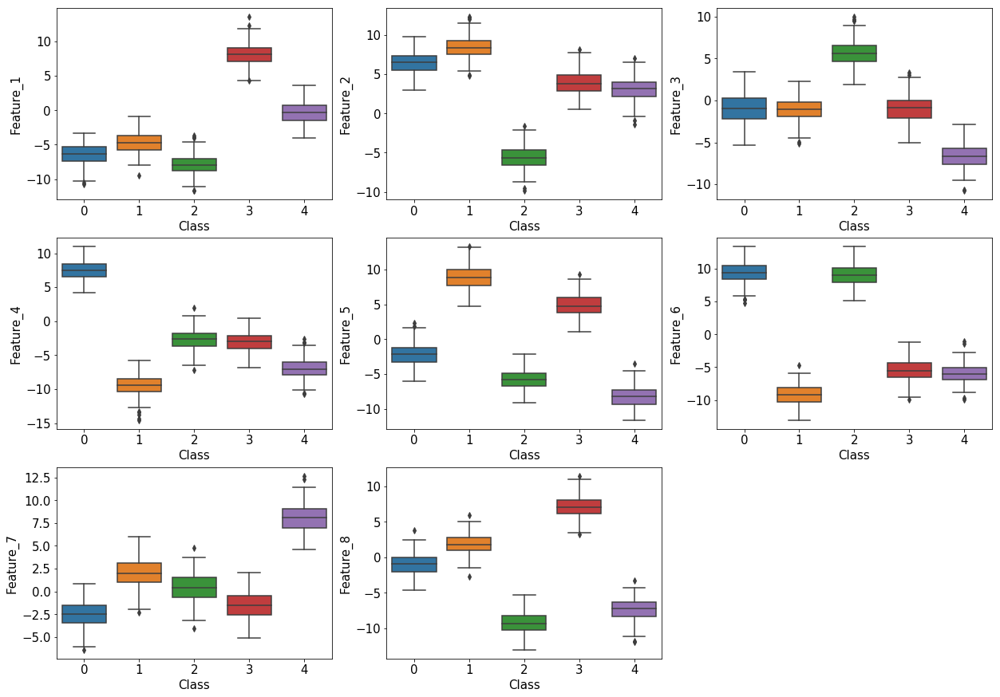

In [15]:
plt.figure(figsize=(21,15))
for i,c in enumerate(df1.columns):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df1[c],x=data1[1])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Class",fontsize=15)
    plt.ylabel(c,fontsize=15)
    #plt.show()

## k-means clustering

In [16]:
from sklearn.cluster import KMeans

### Unlabled data

In [17]:
X=df1

In [18]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,7.130591,3.274214,-2.083181,-3.312229,4.091279,-7.383547,-2.293888,6.506945
1,-3.955980,7.972098,1.557040,9.091835,-3.495812,8.089189,-1.466786,-0.347602
2,-7.293679,8.040932,1.681779,-9.947644,10.344690,-8.353041,0.031797,-0.726134
3,-2.472199,8.336726,0.811814,-10.372719,7.262564,-8.116934,-0.927330,3.795143
4,9.149484,1.067558,-1.481015,-3.272666,3.504570,-2.633851,-1.309456,7.532606


In [19]:
# get cluster labels
y=data1[1]

### Scaling

In [20]:
from sklearn.preprocessing import MinMaxScaler

In [21]:
scaler = MinMaxScaler()

In [22]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [24]:
# see notebook 1 for explanation of these metrics
from sklearn.metrics import silhouette_score, adjusted_rand_score, completeness_score, v_measure_score

### Running k-means and computing inter-cluster distance score for various *k* values

In [25]:
# return clustering metrics for different numbers of k (2-11)

km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -270.0136067357799
Silhouette score for number of cluster(s) 2: 0.440042545225931
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -153.27942937318122
Silhouette score for number of cluster(s) 3: 0.5472662361000962
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -82.28256207978585
Silhouette score for number of cluster(s) 4: 0.6378340175514643
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -33.24558535911755
Silhouette score for number of cluster(s) 5: 0.6976722344977911
V-measure score for number of cluster(s) 

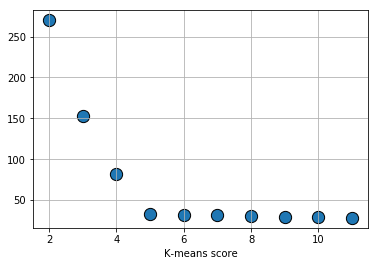

In [28]:
# plot Kmeans score for different k's (2-11) --> elbow at k=5

plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means score")
plt.show()

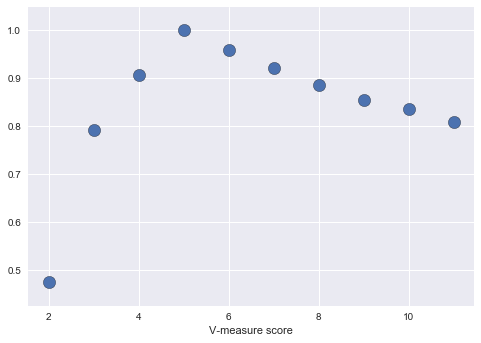

In [23]:
# plot V measure for different k's (2-11) --> maximum at k=5

plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measure score")
plt.show()

In [30]:
# Based on the results above, select k=5 as the optimal k-value and implement Kmeans model with k=5

km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)

In [31]:
# make predictions (clusters) based on this model with k=5
preds_km = km.predict(X_scaled)

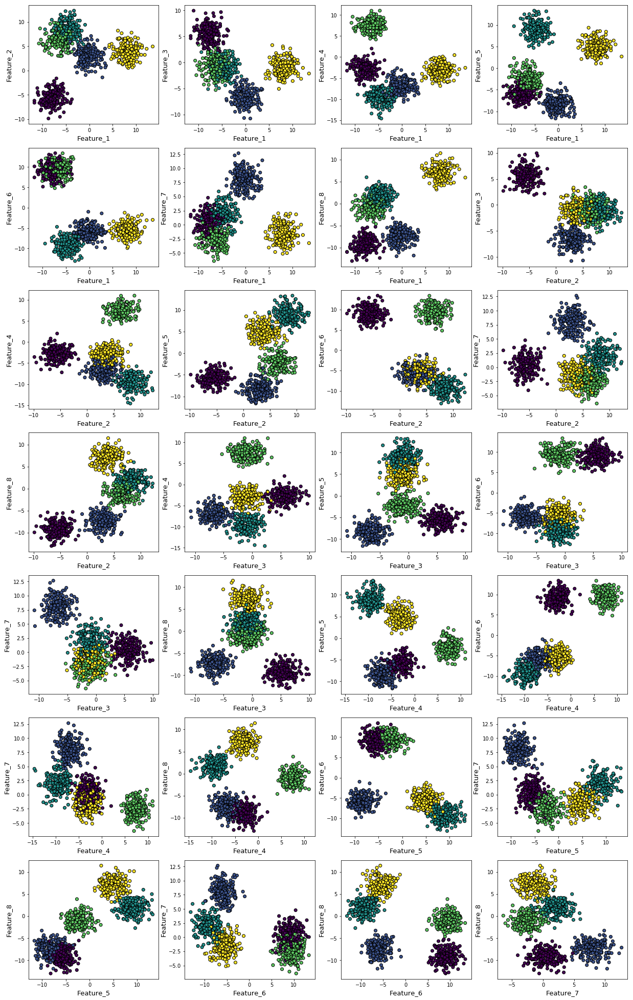

In [33]:
# show the 5 predicted clusters for each feature pair

plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Expectation-maximization (Gaussian Mixture Model)

In [34]:
from sklearn.mixture import GaussianMixture

In [35]:
# get BIC and Log-likelihood score for different number of clusters/components (2-11):

gm_bic= []
gm_score=[]
for i in range(2,12):
    gm = GaussianMixture(n_components=i,n_init=10,tol=1e-3,max_iter=1000).fit(X_scaled)
    print("BIC for number of cluster(s) {}: {}".format(i,gm.bic(X_scaled)))
    print("Log-likelihood score for number of cluster(s) {}: {}".format(i,gm.score(X_scaled)))
    print("-"*100)
    gm_bic.append(-gm.bic(X_scaled))
    gm_score.append(gm.score(X_scaled))

BIC for number of cluster(s) 2: -13841.797637525502
Log-likelihood score for number of cluster(s) 2: 7.228293928677457
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 3: -15522.313128225673
Log-likelihood score for number of cluster(s) 3: 8.22397616780464
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 4: -16218.904321017617
Log-likelihood score for number of cluster(s) 4: 8.72769625797771
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 5: -16772.21928493228
Log-likelihood score for number of cluster(s) 5: 9.159778233712139
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 6: -16550.31106169717
Log-likelihood score for number of cluster(s) 6: 9.204248615871684
-----

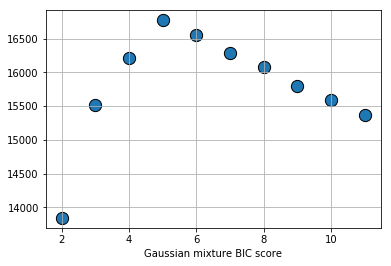

In [37]:
# plot BIC score for different number of clusters/components (2-11)  --> maximum at k=5

plt.scatter(x=[i for i in range(2,12)],y=gm_bic,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Gaussian mixture BIC score")
plt.show()

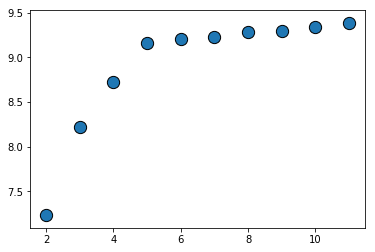

In [38]:
# plot Log-likelihood score for different number of clusters/components (2-11) --> elbow at k=5

plt.scatter(x=[i for i in range(2,12)],y=gm_score,s=150,edgecolor='k')
plt.show()

In [50]:
# Based on the results above, we choose k=5 and fit the Guassian Mixture model with k=5

gm = GaussianMixture(n_components=5,verbose=0,
                     n_init=10,tol=1e-2,covariance_type='full',max_iter=1000).fit(X_scaled)

In [51]:
# Gaussian Mixture Model: get the mean feature values for each of the 5 resulting clusters
gm.means_

array([[0.45443129, 0.58090941, 0.20038037, 0.29978135, 0.13407506,
        0.27278251, 0.75746008, 0.23193012],
       [0.20840652, 0.7358889 , 0.47489295, 0.86153548, 0.37601167,
        0.8496639 , 0.20607811, 0.49014283],
       [0.78576122, 0.61984991, 0.47326714, 0.45092143, 0.66302072,
        0.28685374, 0.25756185, 0.82252868],
       [0.15256329, 0.19318229, 0.78845362, 0.46245417, 0.23507968,
        0.83605351, 0.35694501, 0.15558989],
       [0.27833767, 0.82621692, 0.471982  , 0.1988194 , 0.82514554,
        0.14575174, 0.44116294, 0.60609601]])

In [52]:
# KMeans Model: get the mean feature values for each of the 5 resulting clusters 
km.cluster_centers_

array([[0.15256329, 0.19318229, 0.78845362, 0.46245417, 0.23507968,
        0.83605351, 0.35694501, 0.15558989],
       [0.45443129, 0.58090941, 0.20038037, 0.29978135, 0.13407506,
        0.27278251, 0.75746008, 0.23193012],
       [0.27833767, 0.82621692, 0.471982  , 0.1988194 , 0.82514554,
        0.14575174, 0.44116294, 0.60609601],
       [0.20840652, 0.7358889 , 0.47489295, 0.86153548, 0.37601167,
        0.8496639 , 0.20607811, 0.49014283],
       [0.78576122, 0.61984991, 0.47326714, 0.45092143, 0.66302072,
        0.28685374, 0.25756185, 0.82252868]])

In [53]:
# get the ratio between Guassian Mixture model means and KMeans cluster centers
gm.means_/ km.cluster_centers_

array([[2.97864103, 3.00705306, 0.2541435 , 0.64824012, 0.57033877,
        0.32627398, 2.12206377, 1.49065026],
       [0.45860953, 1.26678771, 2.36995749, 2.87387955, 2.80448639,
        3.11480345, 0.27206464, 2.11332117],
       [2.82305022, 0.75022661, 1.00272287, 2.26799507, 0.80351973,
        1.96809819, 0.58382476, 1.35709304],
       [0.73204664, 0.26251557, 1.66027653, 0.53677902, 0.62519251,
        0.98398144, 1.73208605, 0.31743787],
       [0.35422678, 1.3329306 , 0.99728452, 0.44091807, 1.24452451,
        0.50810473, 1.71284273, 0.73686916]])

In [54]:
# Get predictions (cluster labels for each point) based on GM model
preds_gm=gm.predict(X_scaled)

In [56]:
# Rand Scores:
#------------------------------
# = Rand index adjusted for chance.
# The Rand Index computes a similarity measure between two clusterings
# by considering all pairs of samples and counting pairs that are
# assigned in the same or different clusters in the predicted and
# true clusterings.
# The Rand index has a value between 0 and 1, with 0 indicating that the two data clusterings 
# do not agree on any pair of points and 1 indicating that the data clusterings are exactly the same.

# get rand score for KMeans:
km_rand_score = adjusted_rand_score(preds_km,y)

# get rand score for GM:
gm_rand_score = adjusted_rand_score(preds_gm,y)

# get rand score to compare KMeans with GM:
km_gm_rand_score = adjusted_rand_score(preds_gm, preds_km)

print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)
print("Adjusted Rand score for k-means vs. Gaussian Mixture model",km_gm_rand_score)

Adjusted Rand score for k-means 1.0
Adjusted Rand score for Gaussian Mixture model 1.0
Adjusted Rand score for k-means vs. Gaussian Mixture model 1.0


From the Rand score it seems that we have complete similarity between all 3 clusterings: true clusters, K-means clusters and GM clusters.

In [57]:
# silhouette score for KMeans
silhouette_score(X_scaled,preds_km)

0.6976722344977911

In [58]:
# silhouette score for GM
silhouette_score(X_scaled,preds_gm)

0.6976722344977911

Both silhouette scores (KMeans and Gausian Mixture) are the same.

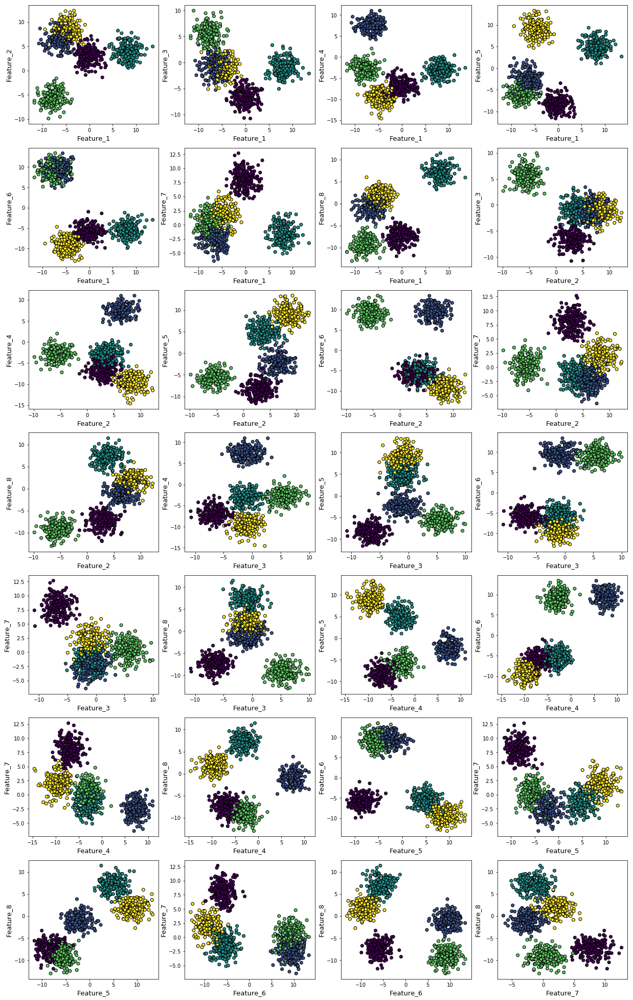

In [60]:
# plot for each feature pair the predicted clusters using Gaussian Mixture model
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## PCA

In [61]:
from sklearn.decomposition import PCA

In [62]:
# set the number of principal components to extract
n_prin_comp = 3

In [64]:
# a) initiate a partial PCA model (i.e. with less principal components than features) and fit to scaled data

pca_partial = PCA(n_components=n_prin_comp, svd_solver='full')
pca_partial.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [65]:
# b) initiate a full PCA model (i.e. with as many principal components as features) and fit to scaled data

pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

### How much variance is explained by principal components?

With the help of this plot, we can decide to work with only the first 3 principal components

In [66]:
# get variance explained by each component for full PCA
pca_explained_var = pca_full.explained_variance_ratio_

In [67]:
# get cumulative variance explained by each component for full PCA
cum_explaiend_var = pca_explained_var.cumsum()

In [68]:
cum_explaiend_var

array([0.47816318, 0.74576104, 0.86592357, 0.96501947, 0.97724058,
       0.9861519 , 0.993357  , 1.        ])

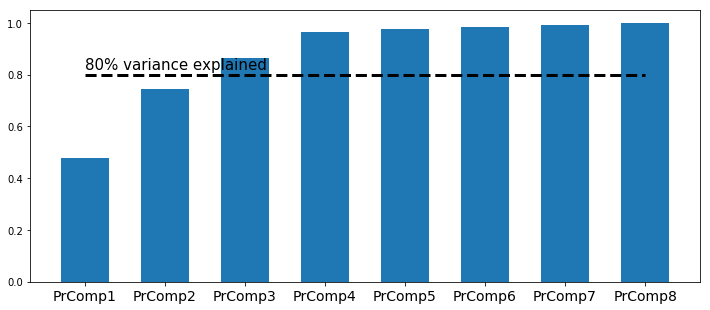

In [80]:
# plot cumulative variance explained

plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,9)],height=cum_explaiend_var,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8, xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [82]:
# transform sclaed features to PCA space and save result to dataframe
X_pca = pca_partial.fit_transform(X_scaled)
df_pca = pd.DataFrame(data = X_pca,
                      columns = ['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])
df_pca.head()

,Principal_comp1,Principal_comp2,Principal_comp3
0,-0.488969,-0.218459,-0.049657
1,0.327557,-0.417076,-0.310586
2,-0.419845,-0.075751,0.404221
3,-0.512765,-0.125634,0.261802
4,-0.380958,-0.249561,-0.058730


### Running k-means on the transformed features

In [83]:
km_scores= []
km_silhouette = []
vmeasure_score =[]

# loop over different k's (2-11):
for i in range(2,12):
    
    # fit Kmeans model on PCA-transformed data and predict cluster labels
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    
    # print clustering scores for model
    # a) KM score
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_pca)))
    km_scores.append(-km.score(X_pca))
    
    # b) Silhouette score
    silhouette = silhouette_score(X_pca,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    
    # c) V measure
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -207.07832831914908
Silhouette score for number of cluster(s) 2: 0.5175715547682824
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -90.4081888680681
Silhouette score for number of cluster(s) 3: 0.6667363632863933
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -27.761125972761832
Silhouette score for number of cluster(s) 4: 0.7715431451126331
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -12.651166704988619
Silhouette score for number of cluster(s) 5: 0.7465514888472153
V-measure score for number of cluster(s

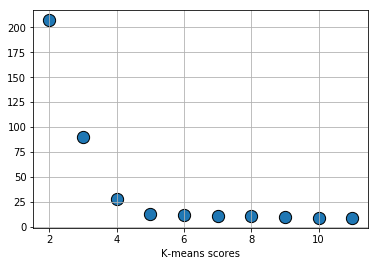

In [84]:
# plot Kmeans score for different k (2-11) --> elbow at k=5

plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means scores")
plt.show()

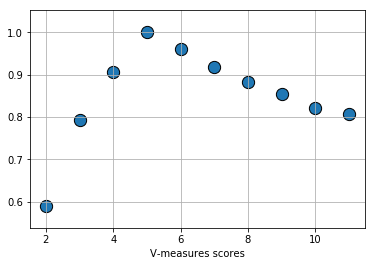

In [85]:
# plot V measure for different k (2-11) --> maximum at k=5

plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measures scores")
plt.show()

### K-means fitting with PCA-transformed data

In [55]:
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running k-means on PCA-transformed features

In [56]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

In [57]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## ICA - Independent Component Analysis.

In [88]:
from sklearn.decomposition import FastICA   # FastICA = a fast algorithm for Independent Component Analysis

In [98]:
# a) Partial ICA model = extract less components than features (here: 3 components extracted)

n_ind_comp = 3
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
        n_components=3, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [99]:
# b) Full ICA model = extract as many components as features

ica_full = FastICA(max_iter=5000)  # ConvergenceWarning with max_iter=1000
ica_full.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=5000,
        n_components=None, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [101]:
# predict cluster labels based on partial ICA model and save to a dataframe

X_ica = ica_partial.fit_transform(X_scaled)
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])
df_ica.head()

,Independent_comp1,Independent_comp2,Independent_comp3
0,-0.001392,0.030597,-0.023128
1,-0.005464,-0.029729,-0.051200
2,-0.032411,0.042570,0.028730
3,-0.021799,0.043362,0.011405
4,-0.004422,0.023623,-0.024762


### Running k-means on the independent features

In [102]:
km_scores= []
km_silhouette = []
vmeasure_score =[]

# loop over different k's (2-11):
for i in range(2,12):
    
    # fit KMeans model on ICA-transformed data
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    
    # print clustering scores
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_ica)))
    km_scores.append(-km.score(X_ica))
    silhouette = silhouette_score(X_ica,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -2.0343326688792387
Silhouette score for number of cluster(s) 2: 0.4020769814545638
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1.0819599857145095
Silhouette score for number of cluster(s) 3: 0.5798668041296119
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -0.3286034940724488
Silhouette score for number of cluster(s) 4: 0.7285385616799608
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -0.12789128223949192
Silhouette score for number of cluster(s) 5: 0.7551571004814889
V-measure score for number of cluste

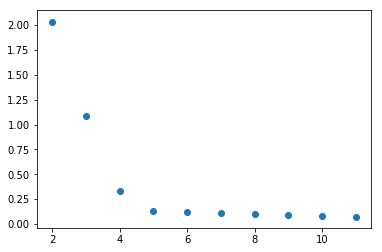

In [104]:
# plot KMeans score for different k (2-11)  --> elbow at k=5

plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

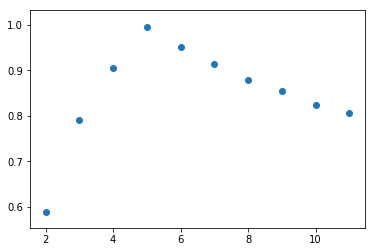

In [105]:
# plot V measure for different k (2-11)  --> maximum at k=5

plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with ICA-transformed data

In [107]:
# based on the results above, we select k=5 as the optimal value for k,
# fit the KMeans model to the ICA-transformed data and get cluster predictions based on this model

km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running k-means on ICA-transformed features

In [111]:
# get combinations for 2 out of 3 independent components for 2D-plotting

col_ica_combi = list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

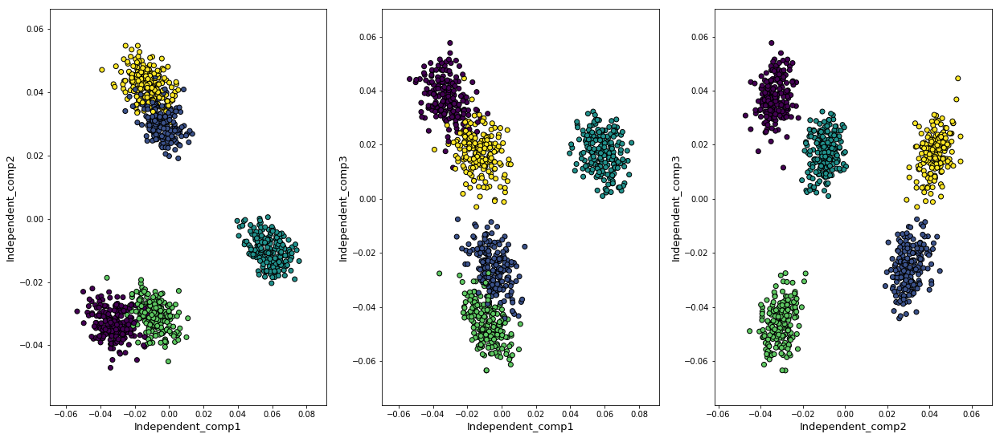

In [110]:
# plot clusters for each of the three independent component pairs

plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Random Projection

In [112]:
from sklearn.random_projection import GaussianRandomProjection

In [113]:
n_random_comp = 3

In [114]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [115]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [116]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running k-means on random projections

In [117]:
km_scores= []
km_silhouette = []
vmeasure_score = []
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_random_proj)))
    km_scores.append(-km.score(X_random_proj))
    silhouette = silhouette_score(X_random_proj,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -299.9933154000814
Silhouette score for number of cluster(s) 2: 0.6425217021082362
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -151.8287161123572
Silhouette score for number of cluster(s) 3: 0.6186171530764512
V-measure score for number of cluster(s) 3: 0.7874634599826422
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -76.51997279821143
Silhouette score for number of cluster(s) 4: 0.6523714884559573
V-measure score for number of cluster(s) 4: 0.9017229806745893
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -44.4852160703983
Silhouette score for number of cluster(s) 5: 0.6285639199887357
V-measure score for number of cluster(s) 5

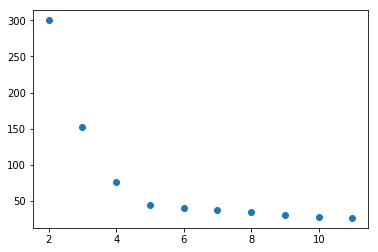

In [118]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

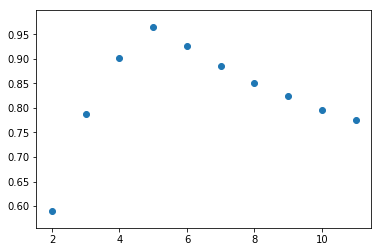

In [119]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with random-projected data

In [120]:
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running k-means on random-projected features

In [121]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

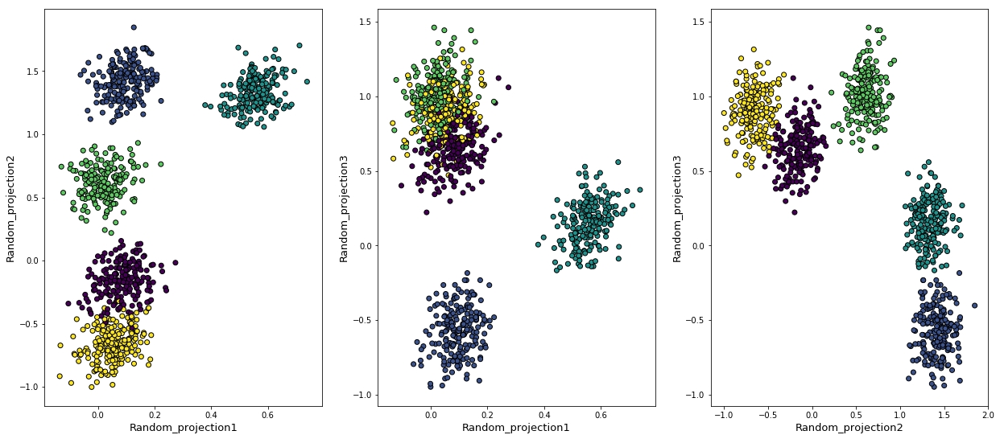

In [122]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

In [123]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

Score for iteration 0: -38.11008098792348
Silhouette score for iteration 0: 0.6496306646006158
V-measure score for iteration 0: 0.976054508004602
----------------------------------------------------------------------------------------------------


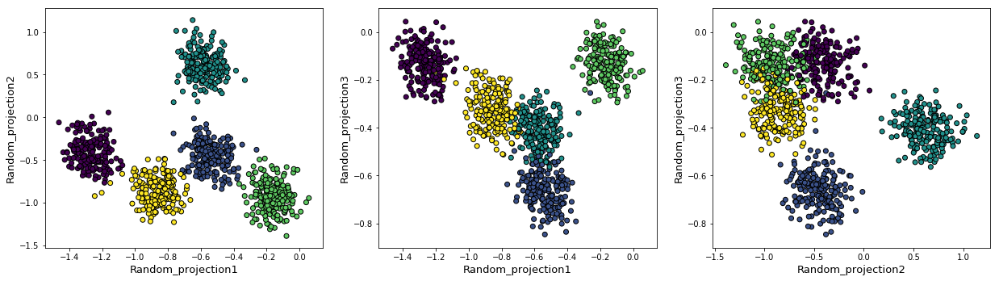

Score for iteration 1: -23.64236735720315
Silhouette score for iteration 1: 0.6355973857952606
V-measure score for iteration 1: 1.0
----------------------------------------------------------------------------------------------------


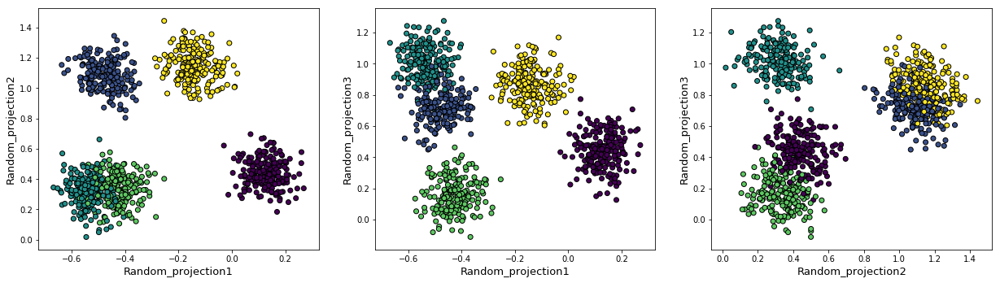

Score for iteration 2: -31.59964029216251
Silhouette score for iteration 2: 0.48644293661346943
V-measure score for iteration 2: 0.8609272867271683
----------------------------------------------------------------------------------------------------


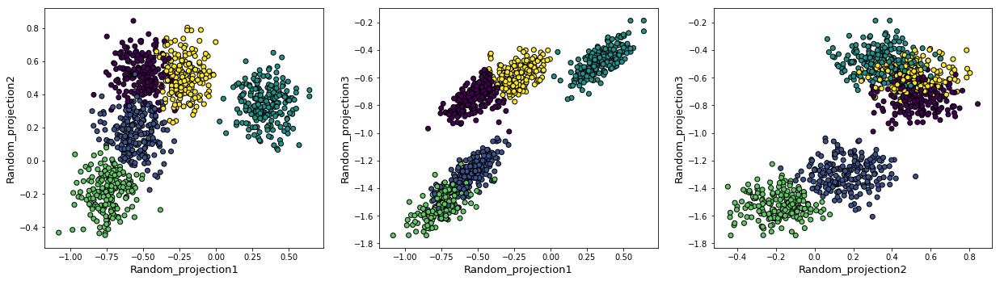

Score for iteration 3: -38.83269771786644
Silhouette score for iteration 3: 0.5759682427660466
V-measure score for iteration 3: 0.96033832894684
----------------------------------------------------------------------------------------------------


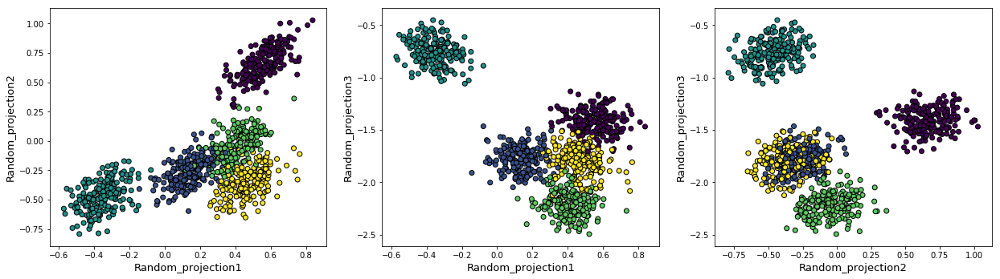

Score for iteration 4: -28.972754428279664
Silhouette score for iteration 4: 0.6879196582233942
V-measure score for iteration 4: 0.9930346013311964
----------------------------------------------------------------------------------------------------


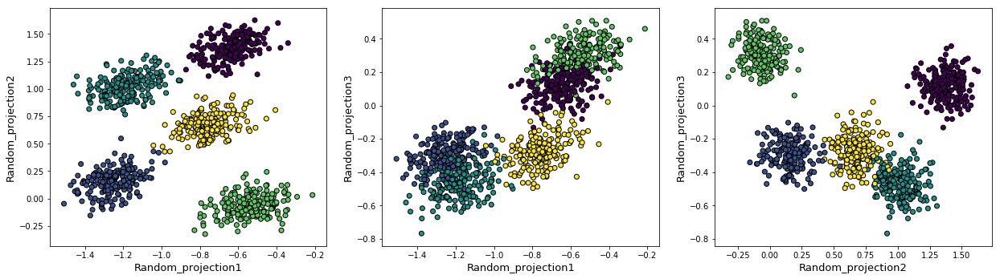

Score for iteration 5: -26.972730943750484
Silhouette score for iteration 5: 0.6427290278857531
V-measure score for iteration 5: 0.9882630023964302
----------------------------------------------------------------------------------------------------


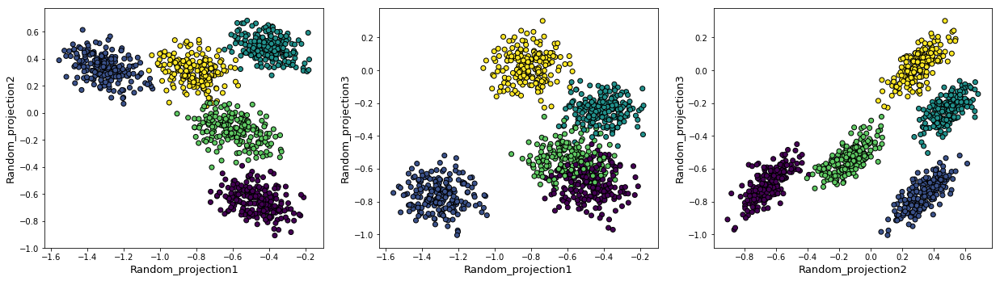

Score for iteration 6: -16.718574471729163
Silhouette score for iteration 6: 0.640598928348668
V-measure score for iteration 6: 0.9335095977493632
----------------------------------------------------------------------------------------------------


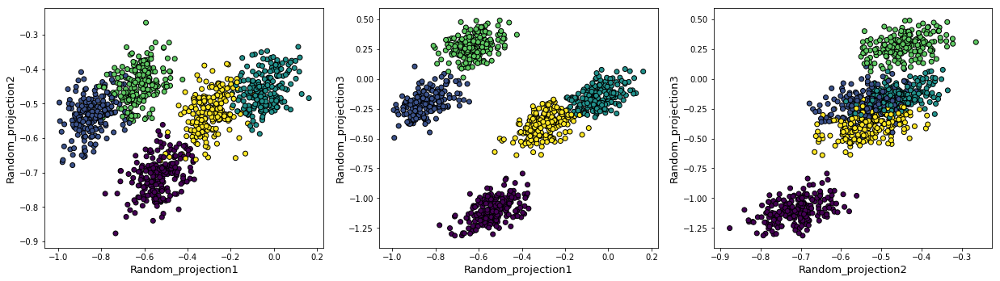

Score for iteration 7: -30.202016014315095
Silhouette score for iteration 7: 0.42818672702458194
V-measure score for iteration 7: 0.867412796863106
----------------------------------------------------------------------------------------------------


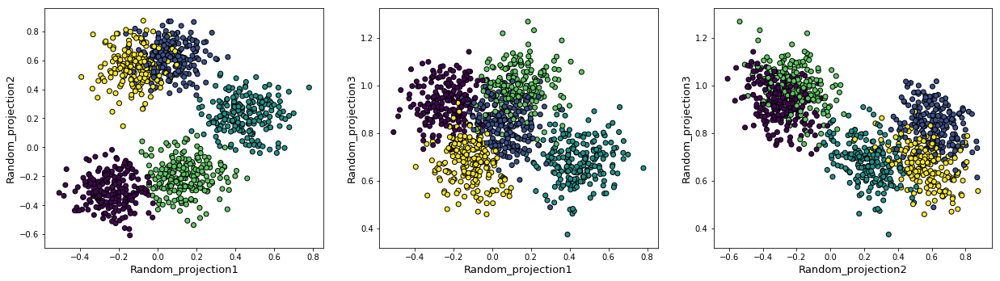

Score for iteration 8: -48.954365678735755
Silhouette score for iteration 8: 0.5199910220559152
V-measure score for iteration 8: 0.8323051910821939
----------------------------------------------------------------------------------------------------


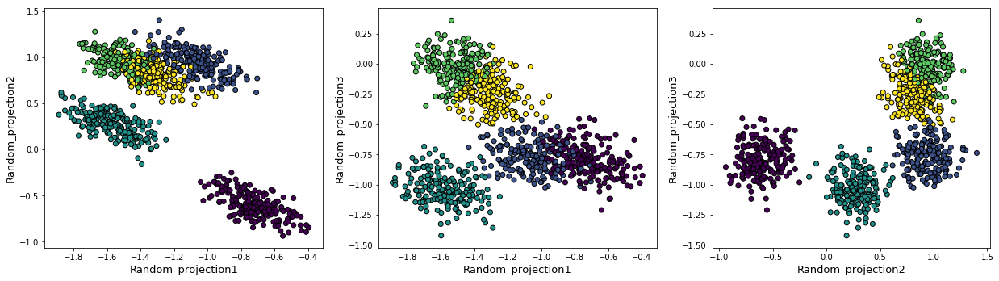

Score for iteration 9: -13.709650116858793
Silhouette score for iteration 9: 0.6251704509737749
V-measure score for iteration 9: 0.9419363675599075
----------------------------------------------------------------------------------------------------


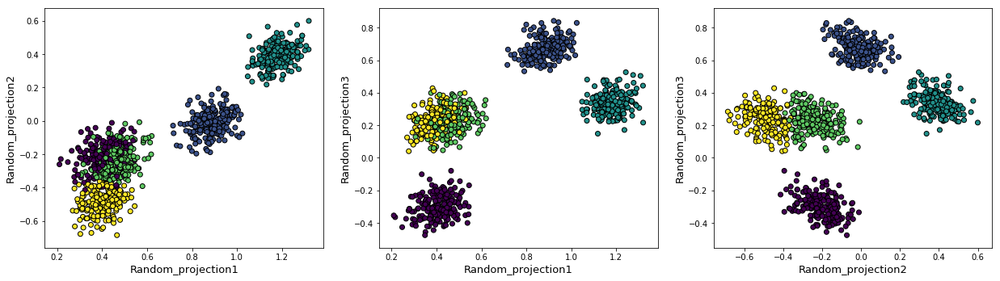

Score for iteration 10: -39.242652756913515
Silhouette score for iteration 10: 0.44904614267733917
V-measure score for iteration 10: 0.8057039231607989
----------------------------------------------------------------------------------------------------


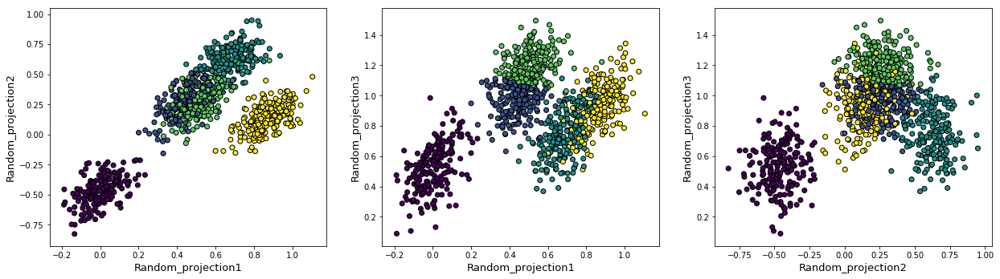

Score for iteration 11: -29.712233970622325
Silhouette score for iteration 11: 0.5214659171410373
V-measure score for iteration 11: 0.8174650930818095
----------------------------------------------------------------------------------------------------


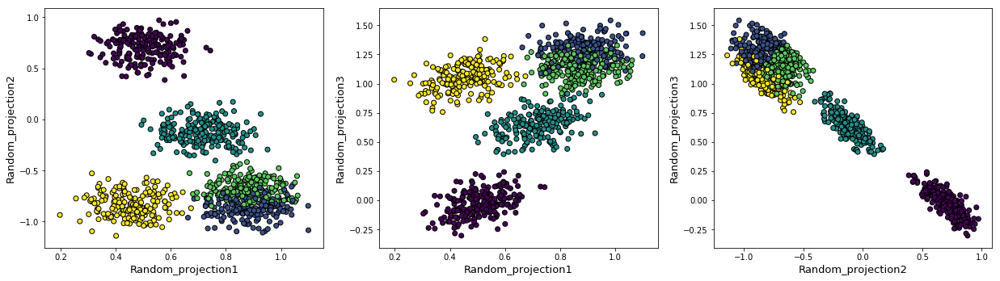

Score for iteration 12: -41.64908574983542
Silhouette score for iteration 12: 0.6059060768677706
V-measure score for iteration 12: 0.9921748171488795
----------------------------------------------------------------------------------------------------


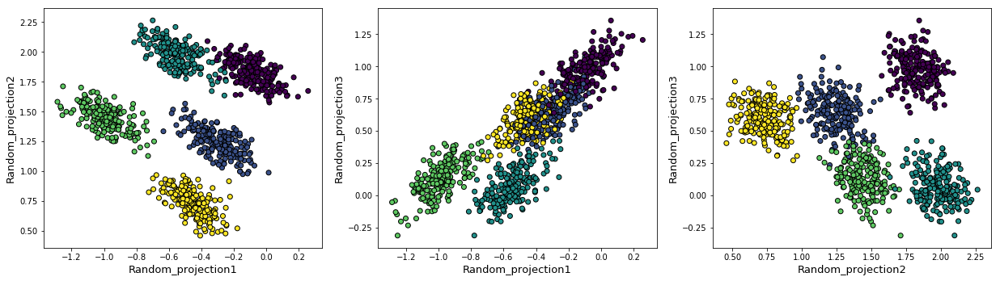

Score for iteration 13: -40.12741722167844
Silhouette score for iteration 13: 0.5395618154504678
V-measure score for iteration 13: 0.877685724184544
----------------------------------------------------------------------------------------------------


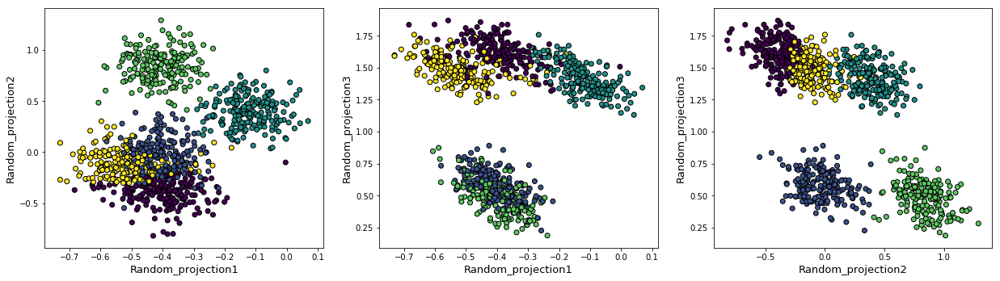

Score for iteration 14: -36.98081817071247
Silhouette score for iteration 14: 0.5209399450618917
V-measure score for iteration 14: 0.910930695321201
----------------------------------------------------------------------------------------------------


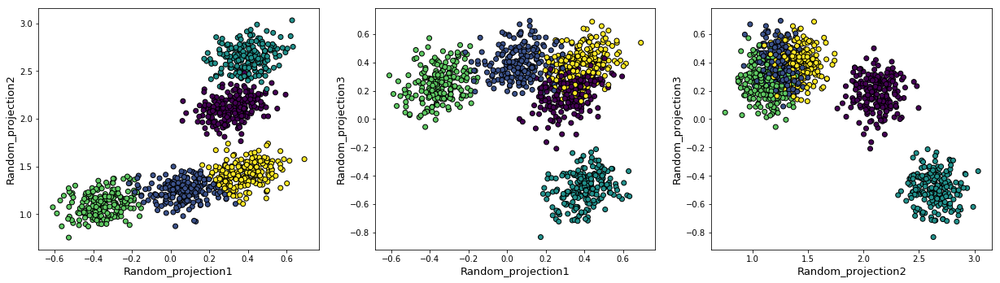

Score for iteration 15: -50.911029692483815
Silhouette score for iteration 15: 0.5663598932456002
V-measure score for iteration 15: 0.9456344847006468
----------------------------------------------------------------------------------------------------


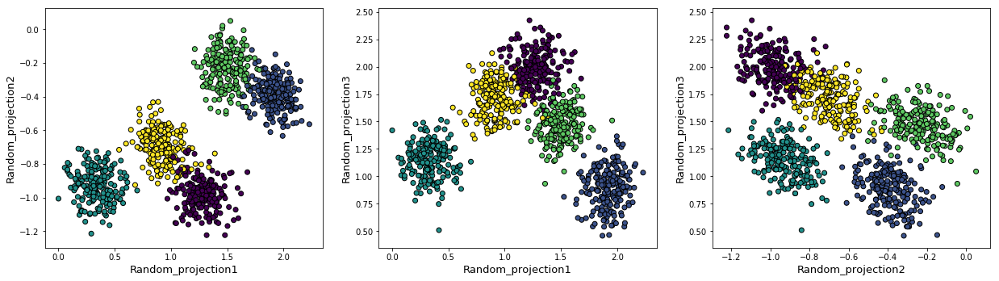

Score for iteration 16: -30.986389834314227
Silhouette score for iteration 16: 0.6954496304651483
V-measure score for iteration 16: 0.9781371627112426
----------------------------------------------------------------------------------------------------


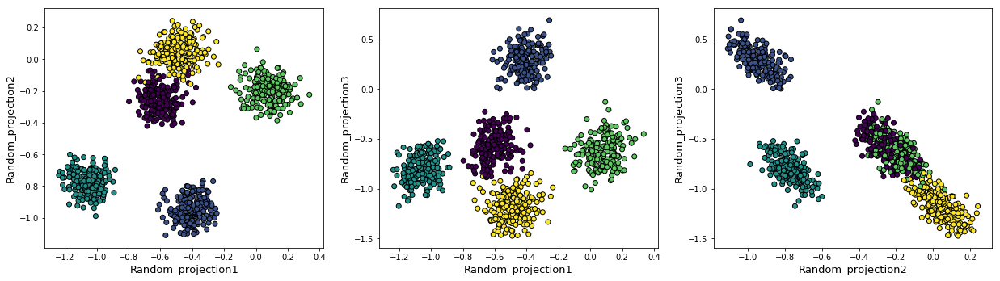

Score for iteration 17: -26.848860613720806
Silhouette score for iteration 17: 0.42746939989043503
V-measure score for iteration 17: 0.730759321512043
----------------------------------------------------------------------------------------------------


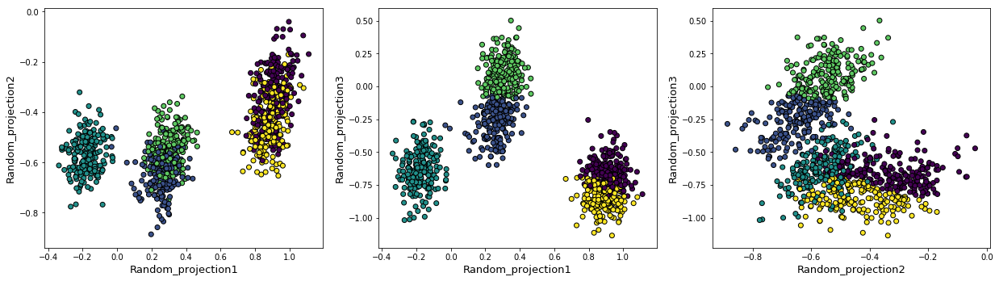

Score for iteration 18: -33.17027257689034
Silhouette score for iteration 18: 0.5362405434997041
V-measure score for iteration 18: 0.8414636468649233
----------------------------------------------------------------------------------------------------


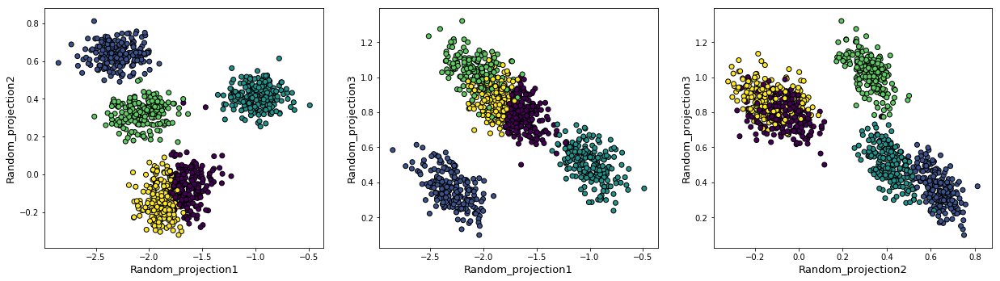

Score for iteration 19: -43.98297035360267
Silhouette score for iteration 19: 0.7306295862909137
V-measure score for iteration 19: 1.0
----------------------------------------------------------------------------------------------------


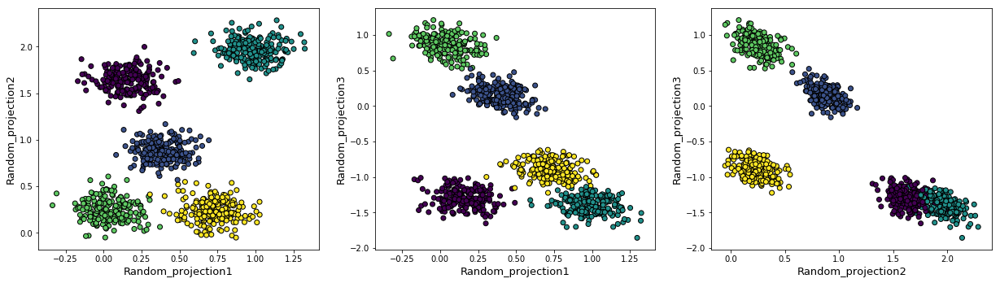

In [132]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []

for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    plot_cluster_rp(df_random_proj,preds)

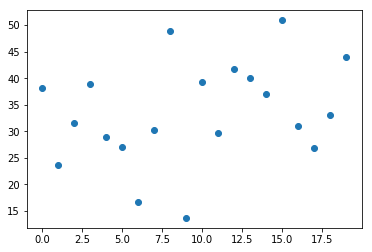

In [133]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

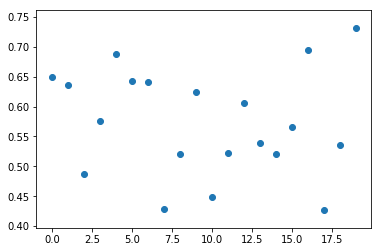

In [134]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

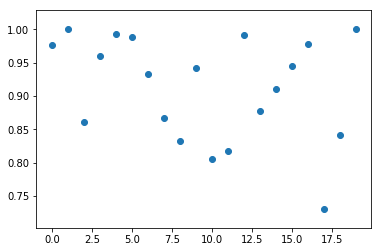

In [135]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [129]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    pca_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    pca_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    pca_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -12.651166704988619
Silhouette score for iteration 0: 0.7465514888472153
V-measure score for iteration 0: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 1: -12.651166704988619
Silhouette score for iteration 1: 0.7465514888472153
V-measure score for iteration 1: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 2: -12.651166704988619
Silhouette score for iteration 2: 0.7465514888472153
V-measure score for iteration 2: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 3: -12.651166704988619
Silhouette score for iteration 3: 0.7465514888472153
V-measure score for iteration 3: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 4: -12.651166704988619
Silhouette score for 

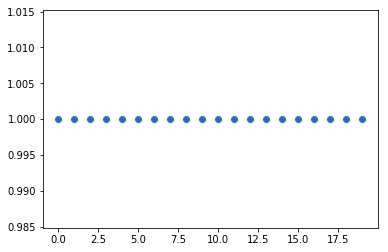

In [131]:
plt.scatter(x=[i for i in range(20)],y=pca_vmeasure)
plt.show()